In [1]:
import boto3
import folium
import json
import matplotlib.pyplot as plt
import pandas as pd
import plotly.express as px
import seaborn as sb
import warnings

from folium.plugins import HeatMap
from io import StringIO
from IPython.display import display, HTML
from matplotlib.widgets import Slider
from plotly.offline import download_plotlyjs , init_notebook_mode , plot, iplot 

warnings.simplefilter(action='ignore', category=FutureWarning)
init_notebook_mode(connected = True)

In [2]:
def get_secret():
    secret_name = "s3_data_analysis"
    region_name = "us-east-1"

    # Create a Secrets Manager client with default credentials
    session = boto3.session.Session()
    client = session.client(
        service_name='secretsmanager',
        region_name=region_name
    )

    try:
        # Retrieve the secret value from Secrets Manager
        get_secret_value_response = client.get_secret_value(
            SecretId=secret_name
        )
    except ClientError as e:
        raise e

    # Extract the secret string (which is a JSON object)
    secret = get_secret_value_response['SecretString']
    
    # Parse the secret string as JSON
    secrets = json.loads(secret)
    
    # Retrieve AWS credentials from the secrets
    aws_access_key_id = secrets['aws_access_key_id']
    aws_secret_access_key = secrets['aws_secret_access_key']
    
    # Now use the retrieved credentials to create the S3 client
    s3_client = boto3.client(
        's3',
        aws_access_key_id=aws_access_key_id,
        aws_secret_access_key=aws_secret_access_key
    )

    return s3_client

s3_client = get_secret()

In [3]:
def read_csv_from_s3(bucket_name, key, s3_client):
    
    try:
        response = s3_client.get_object(Bucket=bucket_name, Key=key)
        csv_content = response['Body'].read().decode('utf-8')
        data = StringIO(csv_content)
        df = pd.read_csv(data)
        return df
    except Exception as e:
         print(f"Error reading CSV from S3: {e}")
         return None

bucket_name = 'nk.data.analysis'
key = 'Uber_Analysis/uber-raw-data-janjune-15_sample.csv'

uber_15 = read_csv_from_s3(bucket_name, key, s3_client)

In [4]:
uber_15.drop_duplicates(inplace=True)

In [5]:
uber_15['Pickup_date'] = pd.to_datetime(uber_15['Pickup_date'])

uber_15['month'] = uber_15['Pickup_date'].dt.month_name()
uber_15['weekday'] = uber_15['Pickup_date'].dt.day_name()
uber_15['day'] = uber_15['Pickup_date'].dt.day
uber_15['hour'] = uber_15['Pickup_date'].dt.hour
uber_15['minute'] = uber_15['Pickup_date'].dt.minute

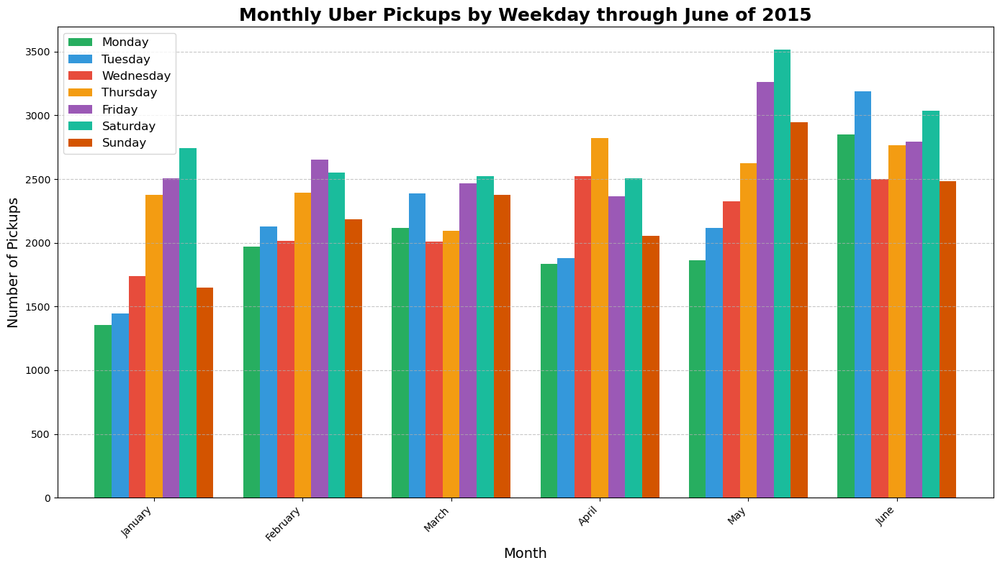

In [6]:
pivot = pd.crosstab(index=uber_15['month'], columns=uber_15['weekday'])

# Define correct order for months & weekdays
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 
               'July', 'August', 'September', 'October', 'November', 'December']

weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Ensure months are in correct order
pivot.index = pd.Categorical(pivot.index, categories=month_order, ordered=True)
pivot = pivot.sort_index()

# Ensure weekdays are in correct order
pivot = pivot[weekday_order]  # Reorder columns

# Define a color palette for the weekdays (matching correct order)
weekday_colors = ['#27AE60', '#3498DB', '#E74C3C', '#F39C12', '#9B59B6', '#1ABC9C', '#D35400']

# Create the bar chart with custom colors
fig, ax = plt.subplots(figsize=(14, 8))  # Reduce height from 12 to 8 for better readability
pivot.plot(kind='bar', ax=ax, color=weekday_colors, width=0.8)  # Adjust bar width

# Enhance visualization
ax.set_title('Monthly Uber Pickups by Weekday through June of 2015', fontsize=18, fontweight='bold')
ax.set_ylabel('Number of Pickups', fontsize=14)
ax.set_xlabel('Month', fontsize=14)
ax.set_xticklabels(pivot.index, rotation=45, ha='right')  # Rotate month labels for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)  # Subtle grid lines for reference

# Move legend inside the plot to save space & ensure correct order
handles, labels = ax.get_legend_handles_labels()
ordered_handles = [handles[weekday_order.index(label)] for label in labels]  # Reorder legend items
ax.legend(ordered_handles, weekday_order, loc='upper left', fontsize=12, frameon=True)

# Reduce whitespace around the plot
plt.tight_layout()

plt.show()

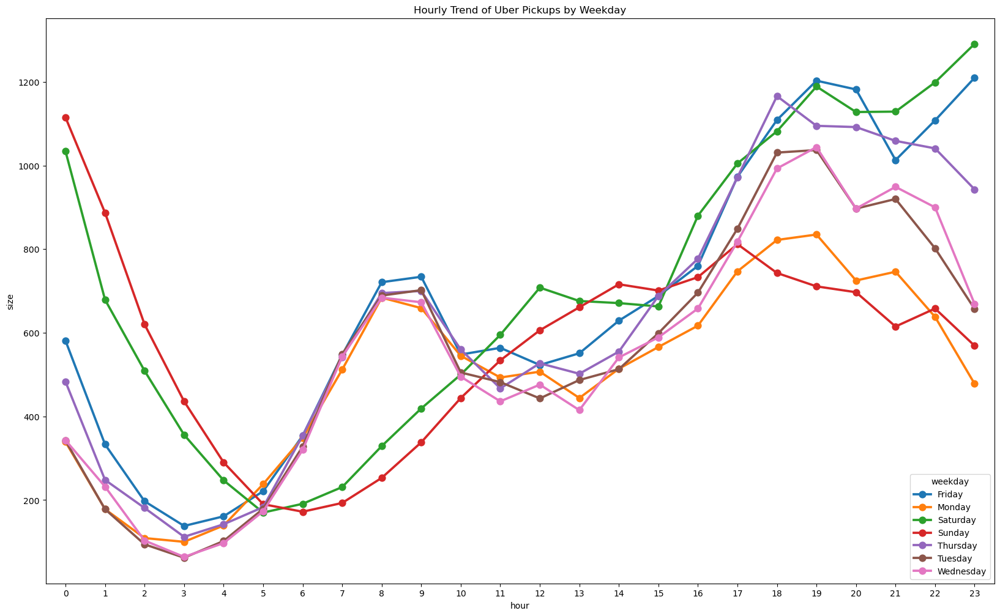

In [7]:
summary = uber_15.groupby(['weekday', 'hour'], as_index=False).size()

plt.figure(figsize=(20,12))
sb.pointplot(x='hour', y='size', hue='weekday', data=summary)

plt.title('Hourly Trend of Uber Pickups by Weekday')

plt.show()

In [8]:
key = 'Uber_Analysis/Uber-Jan-Feb-FOIL.csv'

uber_foil = read_csv_from_s3(bucket_name, key, s3_client)

fig = px.box(
    x='dispatching_base_number', 
    y='active_vehicles', 
    data_frame=uber_foil, 
    title='Distribution of Active Uber Vehicles by Dispatching Base'
)

fig.update_layout(
    xaxis_title='Dispatching Base Number',
    yaxis_title='Number of Active Vehicles'
)

fig.show()

In [10]:
files = [
    file["Key"].removeprefix("Uber_Analysis/") for file in s3_client.list_objects_v2(Bucket=bucket_name, Prefix="Uber_Analysis/").get("Contents", [])
    if not file["Key"].endswith("/")
]

files.sort()
files = files[-8:]

files.remove('uber-raw-data-janjune-15.csv')

files.remove('uber-raw-data-janjune-15_sample.csv')

final = pd.DataFrame()

for file in files:
    current_df = read_csv_from_s3(bucket_name, 'Uber_Analysis/' + file, s3_client)
    final = pd.concat([current_df, final])

final.drop_duplicates(inplace=True)

In [11]:
rush_uber = final.groupby(['Lat', 'Lon'], as_index=False).size()

center_lat = rush_uber['Lat'].mean()
center_lon = rush_uber['Lon'].mean()

basemap = folium.Map(
    location=[center_lat, center_lon], 
    zoom_start=8, 
    scrollWheelZoom=False, 
    control_scale=True     
)

HeatMap(rush_uber).add_to(basemap)

folium.Marker(
    location=[center_lat, center_lon],
    icon=None,
).add_to(basemap)

basemap.get_root().width = "80%"
basemap.get_root().height = "500px"

map_html = basemap._repr_html_()
display(HTML(f"<div style='text-align: center;'>{map_html}</div>"))

In [33]:
final['Date/Time'] = pd.to_datetime(final['Date/Time'], format="%m/%d/%Y %H:%M:%S")

final[['weekday', 'day', 'hour', 'minute']] = final['Date/Time'].apply(
    lambda dt: pd.Series([dt.day_name(), dt.day, dt.hour, dt.minute])
)

weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
final['weekday'] = pd.Categorical(final['weekday'], categories=weekday_order, ordered=True)

def gen_pivot_table(df, col1, col2):
    pivot = df.groupby([col1, col2]).size().unstack()
    # return pivot.style.background_gradient(cmap='coolwarm', axis=None).set_caption("Uber Pickups by {} and {}".format(col1, col2))
    return pivot.style \
        .background_gradient(cmap='coolwarm', axis=None) \
        .set_caption("Uber Pickups by {} and {}".format(col1, col2)) \
        .set_table_styles([{
            'selector': 'table',
            'props': [('height', '900px')]
        }])
    
gen_pivot_table(final, 'day', 'hour')

hour,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
day,,,,,,,,,,,,,,,,,,,,,,,,
1,3178,1944,1256,1308,1429,2126,3664,5380,5292,4617,4607,4729,4930,5794,6933,7910,8633,9511,8604,8001,7315,7803,6268,4050
2,2435,1569,1087,1414,1876,2812,4920,6544,6310,4712,4797,4975,5188,5695,6904,8449,10109,11100,11123,9474,8759,8357,6998,5160
3,3354,2142,1407,1467,1550,2387,4241,5663,5386,4657,4788,5065,5384,6093,7226,8850,10314,10491,11239,9599,9026,8531,7142,4686
4,2897,1688,1199,1424,1696,2581,4592,6029,5704,4744,4743,4975,5193,6175,7158,8515,9492,10357,10259,9097,8358,8649,7706,5130
5,2733,1541,1030,1253,1617,2900,4814,6261,6469,5530,5141,5011,5047,5690,6955,8312,9609,10699,10170,9430,9354,9610,8853,6518
6,4537,2864,1864,1555,1551,2162,3642,4766,4942,4401,4801,5174,5426,6258,7235,8612,9444,9929,9263,8405,8117,8567,7852,5946
7,3645,2296,1507,1597,1763,2422,4102,5575,5376,4639,4905,5166,5364,6214,7276,8474,10393,11013,10573,9472,8691,8525,7194,4801
8,2830,1646,1123,1483,1889,3224,5431,7361,7357,5703,5288,5350,5483,6318,7240,8775,9851,10673,9687,8796,8604,8367,6795,4256
9,2657,1724,1222,1480,1871,3168,5802,7592,7519,5895,5406,5443,5496,6419,7877,9220,10270,11910,11449,9804,8909,8665,7499,5203


In [35]:
gen_pivot_table(final, 'weekday', 'hour')

hour,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
weekday,,,,,,,,,,,,,,,,,,,,,,,,
Monday,6327,3679,2885,6106,9460,14737,23285,30650,28764,21854,19950,19973,20117,23005,27696,32201,38149,41351,36359,33512,32279,28401,19805,11588
Tuesday,6116,3437,2502,4394,7404,13938,26361,35935,33304,24591,23273,23234,23392,28544,34234,40641,47849,54483,49258,43954,43875,39224,27211,14599
Wednesday,7499,4233,3060,4762,7379,13542,26462,35810,33231,25195,24273,24485,25083,28642,34512,42606,49764,54584,51732,46096,46875,43754,32222,17803
Thursday,9116,5169,3629,5532,8355,13889,26561,36393,34856,27376,25502,25538,25983,30300,36048,43604,49615,55645,54768,50927,51044,50938,43381,27203
Friday,13447,8002,5232,6788,8641,13168,22988,31522,30926,24803,23763,24727,25438,29822,35569,42910,47315,50997,53746,48657,42713,47389,48471,40498
Saturday,27096,18783,12464,9356,6746,6990,8450,10831,14176,17384,20218,22320,23879,26177,30851,38104,42735,42013,44995,40271,37922,42938,47107,42388
Sunday,32275,22610,15126,10393,6261,6086,6492,8584,11909,16113,19476,22410,23469,25937,27603,30570,32383,30951,27726,25419,24601,23539,19227,11998
